In [1]:
!pip install d2l==1.0.0a1.post0
!pip install ptflops

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 93.0/93.0 KB 1.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 120.9/120.9 KB 7.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 84.9/84.9 KB 5.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 50.9 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Preparing metadata (setup.py) ... done
  Created wheel for ptflops: filename=ptflops-0.6.9-py3-none-any.whl size=11711 sha256=fa1045ceaf0eae15adf32c1f961ca4e0031e6b4d303e275953664b11f9407ee0
  Stored in directory: /root/.cache/pip/wheels/86/07/9f/879035d99d7b639bbc564d23fed862a679aee7d1a2dced8c2e
Successfully built ptflops


In [2]:
import torch
from torch import nn
from d2l import torch as d2l
import torchsummary
import time
import collections
import random
import re
import ptflops
from ptflops import get_model_complexity_info

#PROBLEM 1

1. Use the GRU example, adjust the hyperparameters (fully connected network and the number of hidden states) and analyze their influence on running time, perplexity, training and validation loss, and the output sequence (try a few examples).

EXAMPLE 1

In [3]:
class GRUScratch(d2l.Module):
    def __init__(self, num_inputs, num_hiddens, sigma=0.01):
        super().__init__()
        self.save_hyperparameters()

        init_weight = lambda *shape: nn.Parameter(torch.randn(*shape) * sigma)
        triple = lambda: (init_weight(num_inputs, num_hiddens),
                          init_weight(num_hiddens, num_hiddens),
                          nn.Parameter(torch.zeros(num_hiddens)))
        self.W_xz, self.W_hz, self.b_z = triple()  # Update gate
        self.W_xr, self.W_hr, self.b_r = triple()  # Reset gate
        self.W_xh, self.W_hh, self.b_h = triple()  # Candidate hidden state

In [4]:
@d2l.add_to_class(GRUScratch)
def forward(self, inputs, H=None):
    if H is None:
        # Initial state with shape: (batch_size, num_hiddens)
        H = torch.zeros((inputs.shape[1], self.num_hiddens),
                      device=inputs.device)
    outputs = []
    for X in inputs:
        Z = torch.sigmoid(torch.matmul(X, self.W_xz) +
                        torch.matmul(H, self.W_hz) + self.b_z)
        R = torch.sigmoid(torch.matmul(X, self.W_xr) +
                        torch.matmul(H, self.W_hr) + self.b_r)
        H_tilde = torch.tanh(torch.matmul(X, self.W_xh) +
                           torch.matmul(R * H, self.W_hh) + self.b_h)
        H = Z * H + (1 - Z) * H_tilde
        outputs.append(H)
    return outputs, H

Training time: 93.76 seconds


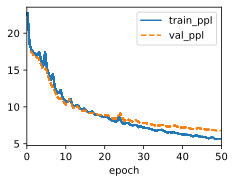

In [5]:
start_time = time.time()
data = d2l.TimeMachine(batch_size=1024, num_steps=32)
gru = GRUScratch(num_inputs=len(data.vocab), num_hiddens=32)
model = d2l.RNNLMScratch(gru, vocab_size=len(data.vocab), lr=4)
trainer = d2l.Trainer(max_epochs=50, gradient_clip_val=1, num_gpus=1)
trainer.fit(model, data)
end_time = time.time()
print(f"Training time: {end_time - start_time:.2f} seconds")

In [ ]:
#And perhaps the thing that struck me most was its dilapidated look.
#The stained-glass windows, which displayed only a geometrical
#pattern, were broken in many places, and the curtains that hung
#across the lower end were thick with dust.
model.predict('and perhaps', 20, data.vocab, d2l.try_gpu())

'and perhaps and the tree the tr'

In [ ]:
#It sounds plausible enough to-night,' said the Medical Man; 'but
#wait until to-morrow. Wait for the common sense of the morning.
model.predict('it sounds', 20, data.vocab, d2l.try_gpu())

'it sounds on the tree the tre'

In [ ]:
#For countless years I judged there had been no danger of
#war or solitary violence, no danger from wild beasts, no wasting
#disease to require strength of constitution, no need of toil.
model.predict('for countless', 20, data.vocab, d2l.try_gpu())

'for countless the the the tree th'

EXAMPLE 2

Training time: 86.98 seconds


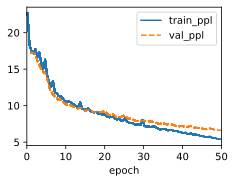

In [ ]:
start_time = time.time()
data = d2l.TimeMachine(batch_size=1024, num_steps=32)
gru = GRUScratch(num_inputs=len(data.vocab), num_hiddens=128)
model = d2l.RNNLMScratch(gru, vocab_size=len(data.vocab), lr=4)
trainer = d2l.Trainer(max_epochs=50, gradient_clip_val=1, num_gpus=1)
trainer.fit(model, data)
end_time = time.time()
print(f"Training time: {end_time - start_time:.2f} seconds")

In [ ]:
#And perhaps the thing that struck me most was its dilapidated look.
#The stained-glass windows, which displayed only a geometrical
#pattern, were broken in many places, and the curtains that hung
#across the lower end were thick with dust.
model.predict('and perhaps', 20, data.vocab, d2l.try_gpu())

'and perhapse the time traveller'

In [ ]:
#It sounds plausible enough to-night,' said the Medical Man; 'but
#wait until to-morrow. Wait for the common sense of the morning.
model.predict('it sounds', 20, data.vocab, d2l.try_gpu())

'it sounds and the time travel'

In [ ]:
#For countless years I judged there had been no danger of
#war or solitary violence, no danger from wild beasts, no wasting
#disease to require strength of constitution, no need of toil.
model.predict('for countless', 20, data.vocab, d2l.try_gpu())

'for countless of the time travell'

EXAMPLE 3

Training time: 100.90 seconds


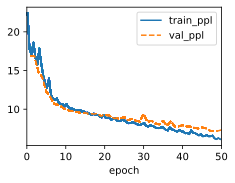

In [ ]:
start_time = time.time()
data = d2l.TimeMachine(batch_size=1024, num_steps=32)
gru = GRUScratch(num_inputs=len(data.vocab), num_hiddens=512)
model = d2l.RNNLMScratch(gru, vocab_size=len(data.vocab), lr=4)
trainer = d2l.Trainer(max_epochs=50, gradient_clip_val=1, num_gpus=1)
trainer.fit(model, data)
end_time = time.time()
print(f"Training time: {end_time - start_time:.2f} seconds")

In [ ]:
#And perhaps the thing that struck me most was its dilapidated look.
#The stained-glass windows, which displayed only a geometrical
#pattern, were broken in many places, and the curtains that hung
#across the lower end were thick with dust.
model.predict('and perhaps', 20, data.vocab, d2l.try_gpu())

'and perhaps and have and have a'

In [ ]:
#It sounds plausible enough to-night,' said the Medical Man; 'but
#wait until to-morrow. Wait for the common sense of the morning.
model.predict('it sounds', 20, data.vocab, d2l.try_gpu())

'it sounds and have and have a'

In [ ]:
#For countless years I judged there had been no danger of
#war or solitary violence, no danger from wild beasts, no wasting
#disease to require strength of constitution, no need of toil.
model.predict('for countless', 20, data.vocab, d2l.try_gpu())

'for countless have and have and h'

2. Use the LSTM example, adjust the hyperparameters (fully connected network and the number of hidden states) and analyze their influence on running time, perplexity, training and validation loss, and the output sequence (try a few examples)

EXAMPLE 1


In [ ]:
class LSTMScratch(d2l.Module):
    def __init__(self, num_inputs, num_hiddens, sigma=0.01):
        super().__init__()
        self.save_hyperparameters()

        init_weight = lambda *shape: nn.Parameter(torch.randn(*shape) * sigma)
        triple = lambda: (init_weight(num_inputs, num_hiddens),
                          init_weight(num_hiddens, num_hiddens),
                          nn.Parameter(torch.zeros(num_hiddens)))
        self.W_xi, self.W_hi, self.b_i = triple()  # Input gate
        self.W_xf, self.W_hf, self.b_f = triple()  # Forget gate
        self.W_xo, self.W_ho, self.b_o = triple()  # Output gate
        self.W_xc, self.W_hc, self.b_c = triple()  # Input node

In [ ]:
@d2l.add_to_class(LSTMScratch)
def forward(self, inputs, H_C=None):
    if H_C is None:
        # Initial state with shape: (batch_size, num_hiddens)
        H = torch.zeros((inputs.shape[1], self.num_hiddens),
                      device=inputs.device)
        C = torch.zeros((inputs.shape[1], self.num_hiddens),
                      device=inputs.device)
    else:
        H, C = H_C
    outputs = []
    for X in inputs:
        I = torch.sigmoid(torch.matmul(X, self.W_xi) +
                        torch.matmul(H, self.W_hi) + self.b_i)
        F = torch.sigmoid(torch.matmul(X, self.W_xf) +
                        torch.matmul(H, self.W_hf) + self.b_f)
        O = torch.sigmoid(torch.matmul(X, self.W_xo) +
                        torch.matmul(H, self.W_ho) + self.b_o)
        C_tilde = torch.tanh(torch.matmul(X, self.W_xc) +
                           torch.matmul(H, self.W_hc) + self.b_c)
        C = F * C + I * C_tilde
        H = O * torch.tanh(C)
        outputs.append(H)
    return outputs, (H, C)

Training time: 69.54 seconds


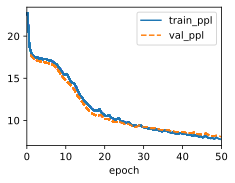

In [ ]:
start_time = time.time()
data = d2l.TimeMachine(batch_size=1024, num_steps=8)
lstm = LSTMScratch(num_inputs=len(data.vocab), num_hiddens=16)
model = d2l.RNNLMScratch(lstm, vocab_size=len(data.vocab), lr=4)
trainer = d2l.Trainer(max_epochs=50, gradient_clip_val=1, num_gpus=1)
trainer.fit(model, data)
end_time = time.time()
print(f"Training time: {end_time - start_time:.2f} seconds")

In [ ]:
#And perhaps the thing that struck me most was its dilapidated look.
#The stained-glass windows, which displayed only a geometrical
#pattern, were broken in many places, and the curtains that hung
#across the lower end were thick with dust.
model.predict('and perhaps', 20, data.vocab, d2l.try_gpu())

'and perhaps and the the the the'

In [ ]:
#It sounds plausible enough to-night,' said the Medical Man; 'but
#wait until to-morrow. Wait for the common sense of the morning.
model.predict('it sounds', 20, data.vocab, d2l.try_gpu())

'it sounds the the the the the'

In [ ]:
#For countless years I judged there had been no danger of
#war or solitary violence, no danger from wild beasts, no wasting
#disease to require strength of constitution, no need of toil.
model.predict('for countless', 20, data.vocab, d2l.try_gpu())

'for countless and the the the the'

EXAMPLE 2

Training time: 83.79 seconds


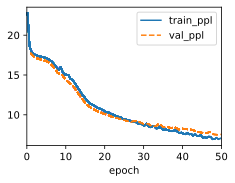

In [ ]:
start_time = time.time()
data = d2l.TimeMachine(batch_size=1024, num_steps=32)
lstm = LSTMScratch(num_inputs=len(data.vocab), num_hiddens=32)
model = d2l.RNNLMScratch(lstm, vocab_size=len(data.vocab), lr=4)
trainer = d2l.Trainer(max_epochs=50, gradient_clip_val=1, num_gpus=1)
trainer.fit(model, data)
end_time = time.time()
print(f"Training time: {end_time - start_time:.2f} seconds")

In [ ]:
#And perhaps the thing that struck me most was its dilapidated look.
#The stained-glass windows, which displayed only a geometrical
#pattern, were broken in many places, and the curtains that hung
#across the lower end were thick with dust.
model.predict('and perhaps', 20, data.vocab, d2l.try_gpu())

'and perhaps and the the mere an'

In [ ]:
#It sounds plausible enough to-night,' said the Medical Man; 'but
#wait until to-morrow. Wait for the common sense of the morning.
model.predict('it sounds', 20, data.vocab, d2l.try_gpu())

'it sounds and the the mere an'

In [ ]:
#For countless years I judged there had been no danger of
#war or solitary violence, no danger from wild beasts, no wasting
#disease to require strength of constitution, no need of toil.
model.predict('for countless', 20, data.vocab, d2l.try_gpu())

'for countless and the the mere an'

EXAMPLE 3

Training time: 89.02 seconds


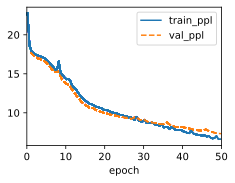

In [ ]:
start_time = time.time()
data = d2l.TimeMachine(batch_size=1024, num_steps=32)
lstm = LSTMScratch(num_inputs=len(data.vocab), num_hiddens=128)
model = d2l.RNNLMScratch(lstm, vocab_size=len(data.vocab), lr=4)
trainer = d2l.Trainer(max_epochs=50, gradient_clip_val=1, num_gpus=1)
trainer.fit(model, data)
end_time = time.time()
print(f"Training time: {end_time - start_time:.2f} seconds")

In [ ]:
#And perhaps the thing that struck me most was its dilapidated look.
#The stained-glass windows, which displayed only a geometrical
#pattern, were broken in many places, and the curtains that hung
#across the lower end were thick with dust.
model.predict('and perhaps', 20, data.vocab, d2l.try_gpu())

'and perhaps and the the the the'

In [ ]:
#It sounds plausible enough to-night,' said the Medical Man; 'but
#wait until to-morrow. Wait for the common sense of the morning.
model.predict('it sounds', 20, data.vocab, d2l.try_gpu())

'it sounds a merith and the th'

In [ ]:
#For countless years I judged there had been no danger of
#war or solitary violence, no danger from wild beasts, no wasting
#disease to require strength of constitution, no need of toil.
model.predict('for countless', 20, data.vocab, d2l.try_gpu())

'for countless the the the the the'

3. Compare runtime for training and inference, computational and mode size complexities, training and validation loss, and the output sequence (try a few examples)for rnn.RNN, rnn.LSTM and rnn.GRU implementations with each other use the same hyperparameters for your comparison. 


 rnn.RNN

In [ ]:
class RNN(d2l.Module):
    """The RNN model implemented with high-level APIs."""
    def __init__(self, num_inputs, num_hiddens):
        super().__init__()
        self.save_hyperparameters()
        self.rnn = nn.RNN(num_inputs, num_hiddens)

    def forward(self, inputs, H=None):
        return self.rnn(inputs, H)

In [ ]:
class RNNLM(d2l.RNNLMScratch):
    """The RNN-based language model implemented with high-level APIs."""
    def init_params(self):
        self.linear = nn.LazyLinear(self.vocab_size)

    def output_layer(self, hiddens):
        return self.linear(hiddens).swapaxes(0, 1)

Training time: 196.13 seconds


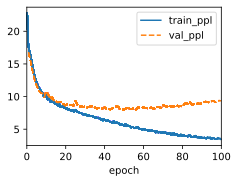

In [ ]:
start_time = time.time()
data = d2l.TimeMachine(batch_size=1024, num_steps=32)
rnn = RNN(num_inputs=len(data.vocab), num_hiddens=128)
model = RNNLM(rnn, vocab_size=len(data.vocab), lr=1)
trainer = d2l.Trainer(max_epochs=100, gradient_clip_val=1, num_gpus=1)
trainer.fit(model, data)
end_time = time.time()
print(f"Training time: {end_time - start_time:.2f} seconds")

In [ ]:
macs, params = ptflops.get_model_complexity_info(rnn, (3, len(data.vocab)))
print('{:<30}  {:<8}'.format('Computational complexity: ', macs))
print('{:<30}  {:<8}'.format('Number of parameters: ', params))

RNN(
  20.22 k, 100.000% Params, 61.06 KMac, 100.000% MACs, 
  (rnn): RNN(20.22 k, 100.000% Params, 61.06 KMac, 100.000% MACs, 28, 128)
)
Computational complexity:       61.06 KMac
Number of parameters:           20.22 k 


In [ ]:
#And perhaps the thing that struck me most was its dilapidated look.
#The stained-glass windows, which displayed only a geometrical
#pattern, were broken in many places, and the curtains that hung
#across the lower end were thick with dust.
model.predict('and perhaps', 20, data.vocab, d2l.try_gpu())

'and perhaps comis count urist l'

In [ ]:
#It sounds plausible enough to-night,' said the Medical Man; 'but
#wait until to-morrow. Wait for the common sense of the morning.
model.predict('it sounds', 20, data.vocab, d2l.try_gpu())

'it soundste the former three '

In [ ]:
#For countless years I judged there had been no danger of
#war or solitary violence, no danger from wild beasts, no wasting
#disease to require strength of constitution, no need of toil.
model.predict('for countless', 20, data.vocab, d2l.try_gpu())

'for countless one fiche sor seati'

 rnn.LSTM

In [ ]:
class LSTM(d2l.RNN):
    def __init__(self, num_inputs, num_hiddens):
        d2l.Module.__init__(self)
        self.save_hyperparameters()
        self.rnn = nn.LSTM(num_inputs, num_hiddens)

    def forward(self, inputs, H_C=None):
        return self.rnn(inputs, H_C)

Training time: 462.50 seconds


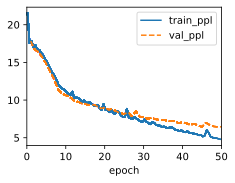

In [ ]:
start_time = time.time()
lstm = LSTM(num_inputs=len(data.vocab), num_hiddens=128)
model = d2l.RNNLM(lstm, vocab_size=len(data.vocab), lr=4)
trainer.fit(model, data)
end_time = time.time()
print(f"Training time: {end_time - start_time:.2f} seconds")

In [ ]:
macs, params = ptflops.get_model_complexity_info(lstm, (3, len(data.vocab)))
print('{:<30}  {:<8}'.format('Computational complexity: ', macs))
print('{:<30}  {:<8}'.format('Number of parameters: ', params))

LSTM(
  80.9 k, 100.000% Params, 246.53 KMac, 100.000% MACs, 
  (rnn): LSTM(80.9 k, 100.000% Params, 246.53 KMac, 100.000% MACs, 28, 128)
)
Computational complexity:       246.53 KMac
Number of parameters:           80.9 k  


In [ ]:
#And perhaps the thing that struck me most was its dilapidated look.
#The stained-glass windows, which displayed only a geometrical
#pattern, were broken in many places, and the curtains that hung
#across the lower end were thick with dust.
model.predict('and perhaps', 20, data.vocab, d2l.try_gpu())

'and perhapser the prove the tim'

In [ ]:
#It sounds plausible enough to-night,' said the Medical Man; 'but
#wait until to-morrow. Wait for the common sense of the morning.
model.predict('it sounds', 20, data.vocab, d2l.try_gpu())

'it sounds one mist a dimensio'

In [ ]:
#For countless years I judged there had been no danger of
#war or solitary violence, no danger from wild beasts, no wasting
#disease to require strength of constitution, no need of toil.
model.predict('for countless', 20, data.vocab, d2l.try_gpu())

'for countless one mist to time tr'

 rnn.GRU

In [6]:
# Concise Implementation for rnn.GRU
class GRU(d2l.RNN):
    def __init__(self, num_inputs, num_hiddens):
        d2l.Module.__init__(self)
        self.save_hyperparameters()
        self.rnn = nn.GRU(num_inputs, num_hiddens)

Training time: 216.78 seconds


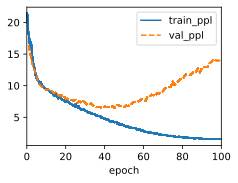

In [7]:
start_time = time.time()
gru = GRU(num_inputs=len(data.vocab), num_hiddens=128)
model = d2l.RNNLM(gru, vocab_size=len(data.vocab), lr=4)
trainer = d2l.Trainer(max_epochs=100, gradient_clip_val=1, num_gpus=1)
trainer.fit(model, data)
end_time = time.time()
print(f"Training time: {end_time - start_time:.2f} seconds")

In [8]:
macs, params = ptflops.get_model_complexity_info(gru, (3, len(data.vocab)))
print('{:<30}  {:<8}'.format('Computational complexity: ', macs))
print('{:<30}  {:<8}'.format('Number of parameters: ', params))

GRU(
  60.67 k, 100.000% Params, 184.7 KMac, 100.000% MACs, 
  (rnn): GRU(60.67 k, 100.000% Params, 184.7 KMac, 100.000% MACs, 28, 128)
)
Computational complexity:       184.7 KMac
Number of parameters:           60.67 k 


In [9]:
#And perhaps the thing that struck me most was its dilapidated look.
#The stained-glass windows, which displayed only a geometrical
#pattern, were broken in many places, and the curtains that hung
#across the lower end were thick with dust.
model.predict('and perhaps', 20, data.vocab, d2l.try_gpu())

'and perhapsed in our glasses ou'

In [10]:
#It sounds plausible enough to-night,' said the Medical Man; 'but
#wait until to-morrow. Wait for the common sense of the morning.
model.predict('it sounds', 20, data.vocab, d2l.try_gpu())

'it sounds psechtle abobu can '

In [11]:
#For countless years I judged there had been no danger of
#war or solitary violence, no danger from wild beasts, no wasting
#disease to require strength of constitution, no need of toil.
model.predict('for countless', 20, data.vocab, d2l.try_gpu())

'for countless his expling and the'

#PROBLEM 2

1. Build the model by replacing the GRU with an LSTM and compare the training and validation loss, and the output sequence (try a few examples) against GRU.

In [12]:
class GRU(d2l.RNN):
    """The multi-layer GRU model."""
    def __init__(self, num_inputs, num_hiddens, num_layers, dropout=0):
        d2l.Module.__init__(self)
        self.save_hyperparameters()
        self.rnn = nn.GRU(num_inputs, num_hiddens, num_layers,
                          dropout=dropout)

Training time: 206.89 seconds


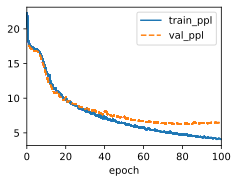

In [13]:
start_time = time.time()
gru = GRU(num_inputs=len(data.vocab), num_hiddens=32, num_layers=2)
model = d2l.RNNLM(gru, vocab_size=len(data.vocab), lr=2)
trainer.fit(model, data)
end_time = time.time()
print(f"Training time: {end_time - start_time:.2f} seconds")

In [19]:
macs, params = ptflops.get_model_complexity_info(gru, (3, len(data.vocab)))
print('{:<30}  {:<8}'.format('Computational complexity: ', macs))
print('{:<30}  {:<8}'.format('Number of parameters: ', params))

GRU(
  12.29 k, 100.000% Params, 38.21 KMac, 100.000% MACs, 
  (rnn): GRU(12.29 k, 100.000% Params, 38.21 KMac, 100.000% MACs, 28, 32, num_layers=2)
)
Computational complexity:       38.21 KMac
Number of parameters:           12.29 k 


In [14]:
#And perhaps the thing that struck me most was its dilapidated look.
#The stained-glass windows, which displayed only a geometrical
#pattern, were broken in many places, and the curtains that hung
#across the lower end were thick with dust.
model.predict('and perhaps', 20, data.vocab, d2l.try_gpu())

'and perhapse the time traveller'

In [15]:
#It sounds plausible enough to-night,' said the Medical Man; 'but
#wait until to-morrow. Wait for the common sense of the morning.
model.predict('it sounds', 20, data.vocab, d2l.try_gpu())

'it sounds ther dimension and '

In [16]:
#For countless years I judged there had been no danger of
#war or solitary violence, no danger from wild beasts, no wasting
#disease to require strength of constitution, no need of toil.
model.predict('for countless', 20, data.vocab, d2l.try_gpu())

'for countless so it there at ther'

2. Compare runtime for training and inference, computational and mode size complexities, and the output strings for nn.LSTM and rnn.GRU implementations with each other.

In [34]:
class LSTM(d2l.RNN):
    """The multi-layer LSTM model."""
    def __init__(self, num_inputs, num_hiddens, num_layers, dropout=0):
        d2l.Module.__init__(self)
        self.save_hyperparameters()
        self.rnn = nn.LSTM(num_inputs, num_hiddens, num_layers,
                          dropout=dropout)

Training time: 212.46 seconds


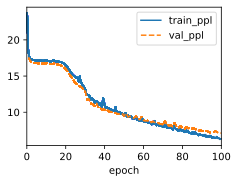

In [35]:
start_time = time.time()
lstm = LSTM(num_inputs=len(data.vocab), num_hiddens=32, num_layers=2)
model = d2l.RNNLM(lstm, vocab_size=len(data.vocab), lr=2)
trainer = d2l.Trainer(max_epochs=100, gradient_clip_val=1, num_gpus=1)
trainer.fit(model, data)
end_time = time.time()
print(f"Training time: {end_time - start_time:.2f} seconds")

In [37]:
macs, params = ptflops.get_model_complexity_info(lstm, (3, len(data.vocab)))
print('{:<30}  {:<8}'.format('Computational complexity: ', macs))
print('{:<30}  {:<8}'.format('Number of parameters: ', params))

LSTM(
  16.38 k, 100.000% Params, 51.07 KMac, 100.000% MACs, 
  (rnn): LSTM(16.38 k, 100.000% Params, 51.07 KMac, 100.000% MACs, 28, 32, num_layers=2)
)
Computational complexity:       51.07 KMac
Number of parameters:           16.38 k 


In [38]:
#And perhaps the thing that struck me most was its dilapidated look.
#The stained-glass windows, which displayed only a geometrical
#pattern, were broken in many places, and the curtains that hung
#across the lower end were thick with dust.
model.predict('and perhaps', 20, data.vocab, d2l.try_gpu())

'and perhaps the time the time t'

In [39]:
#It sounds plausible enough to-night,' said the Medical Man; 'but
#wait until to-morrow. Wait for the common sense of the morning.
model.predict('it sounds', 20, data.vocab, d2l.try_gpu())

'it sounds the time the time t'

In [40]:
#For countless years I judged there had been no danger of
#war or solitary violence, no danger from wild beasts, no wasting
#disease to require strength of constitution, no need of toil.
model.predict('for countless', 20, data.vocab, d2l.try_gpu())

'for countless the time the time t'

3. Adjust the hyperparameters (fully connected network, number of hidden layers, and the number of hidden states) and compare your results (training and validation loss, computation complexity, model size, training and inference time, and the output sequence). Analyze their influence on accuracy, running time, and computational perplexity.

GRU

Training time: 237.50 seconds


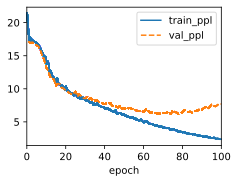

In [24]:
start_time = time.time()
gru = GRU(num_inputs=len(data.vocab), num_hiddens=128, num_layers=2)
model = d2l.RNNLM(gru, vocab_size=len(data.vocab), lr=2)
trainer.fit(model, data)
end_time = time.time()
print(f"Training time: {end_time - start_time:.2f} seconds")

In [25]:
macs, params = ptflops.get_model_complexity_info(gru, (3, len(data.vocab)))
print('{:<30}  {:<8}'.format('Computational complexity: ', macs))
print('{:<30}  {:<8}'.format('Number of parameters: ', params))

GRU(
  159.74 k, 100.000% Params, 484.61 KMac, 100.000% MACs, 
  (rnn): GRU(159.74 k, 100.000% Params, 484.61 KMac, 100.000% MACs, 28, 128, num_layers=2)
)
Computational complexity:       484.61 KMac
Number of parameters:           159.74 k


In [26]:
#And perhaps the thing that struck me most was its dilapidated look.
#The stained-glass windows, which displayed only a geometrical
#pattern, were broken in many places, and the curtains that hung
#across the lower end were thick with dust.
model.predict('and perhaps', 20, data.vocab, d2l.try_gpu())

'and perhapsing with a lather at'

In [27]:
#It sounds plausible enough to-night,' said the Medical Man; 'but
#wait until to-morrow. Wait for the common sense of the morning.
model.predict('it sounds', 20, data.vocab, d2l.try_gpu())

'it sounds of space was iver a'

In [28]:
#For countless years I judged there had been no danger of
#war or solitary violence, no danger from wild beasts, no wasting
#disease to require strength of constitution, no need of toil.
model.predict('for countless', 20, data.vocab, d2l.try_gpu())

'for countless gove about in all i'

Training time: 259.69 seconds


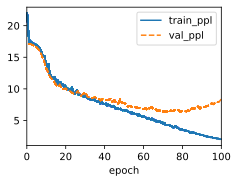

In [29]:
start_time = time.time()
gru = GRU(num_inputs=len(data.vocab), num_hiddens=256, num_layers=2)
model = d2l.RNNLM(gru, vocab_size=len(data.vocab), lr=2)
trainer.fit(model, data)
end_time = time.time()
print(f"Training time: {end_time - start_time:.2f} seconds")

In [30]:
macs, params = ptflops.get_model_complexity_info(gru, (3, len(data.vocab)))
print('{:<30}  {:<8}'.format('Computational complexity: ', macs))
print('{:<30}  {:<8}'.format('Number of parameters: ', params))

GRU(
  614.4 k, 100.000% Params, 1.85 MMac, 100.000% MACs, 
  (rnn): GRU(614.4 k, 100.000% Params, 1.85 MMac, 100.000% MACs, 28, 256, num_layers=2)
)
Computational complexity:       1.85 MMac
Number of parameters:           614.4 k 


In [31]:
#And perhaps the thing that struck me most was its dilapidated look.
#The stained-glass windows, which displayed only a geometrical
#pattern, were broken in many places, and the curtains that hung
#across the lower end were thick with dust.
model.predict('and perhaps', 20, data.vocab, d2l.try_gpu())

'and perhaps donn way oh a momen'

In [32]:
#It sounds plausible enough to-night,' said the Medical Man; 'but
#wait until to-morrow. Wait for the common sense of the morning.
model.predict('it sounds', 20, data.vocab, d2l.try_gpu())

'it sounds why cannot move abo'

In [33]:
#For countless years I judged there had been no danger of
#war or solitary violence, no danger from wild beasts, no wasting
#disease to require strength of constitution, no need of toil.
model.predict('for countless', 20, data.vocab, d2l.try_gpu())

'for countless pone who reas of hi'

LSTM

Training time: 230.06 seconds


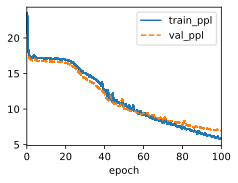

In [41]:
start_time = time.time()
lstm = LSTM(num_inputs=len(data.vocab), num_hiddens=128, num_layers=2)
model = d2l.RNNLM(lstm, vocab_size=len(data.vocab), lr=2)
trainer = d2l.Trainer(max_epochs=100, gradient_clip_val=1, num_gpus=1)
trainer.fit(model, data)
end_time = time.time()
print(f"Training time: {end_time - start_time:.2f} seconds")

In [42]:
macs, params = ptflops.get_model_complexity_info(lstm, (3, len(data.vocab)))
print('{:<30}  {:<8}'.format('Computational complexity: ', macs))
print('{:<30}  {:<8}'.format('Number of parameters: ', params))

LSTM(
  212.99 k, 100.000% Params, 646.66 KMac, 100.000% MACs, 
  (rnn): LSTM(212.99 k, 100.000% Params, 646.66 KMac, 100.000% MACs, 28, 128, num_layers=2)
)
Computational complexity:       646.66 KMac
Number of parameters:           212.99 k


In [43]:
#And perhaps the thing that struck me most was its dilapidated look.
#The stained-glass windows, which displayed only a geometrical
#pattern, were broken in many places, and the curtains that hung
#across the lower end were thick with dust.
model.predict('and perhaps', 20, data.vocab, d2l.try_gpu())

'and perhaps the the the the the'

In [44]:
#It sounds plausible enough to-night,' said the Medical Man; 'but
#wait until to-morrow. Wait for the common sense of the morning.
model.predict('it sounds', 20, data.vocab, d2l.try_gpu())

'it sounds and the the the the'

In [45]:
#For countless years I judged there had been no danger of
#war or solitary violence, no danger from wild beasts, no wasting
#disease to require strength of constitution, no need of toil.
model.predict('for countless', 20, data.vocab, d2l.try_gpu())

'for countless of the the the the '

Training time: 253.85 seconds


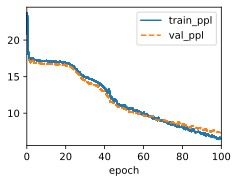

In [46]:
start_time = time.time()
lstm = LSTM(num_inputs=len(data.vocab), num_hiddens=256, num_layers=2)
model = d2l.RNNLM(lstm, vocab_size=len(data.vocab), lr=2)
trainer = d2l.Trainer(max_epochs=100, gradient_clip_val=1, num_gpus=1)
trainer.fit(model, data)
end_time = time.time()
print(f"Training time: {end_time - start_time:.2f} seconds")

In [47]:
macs, params = ptflops.get_model_complexity_info(lstm, (3, len(data.vocab)))
print('{:<30}  {:<8}'.format('Computational complexity: ', macs))
print('{:<30}  {:<8}'.format('Number of parameters: ', params))

LSTM(
  819.2 k, 100.000% Params, 2.47 MMac, 100.000% MACs, 
  (rnn): LSTM(819.2 k, 100.000% Params, 2.47 MMac, 100.000% MACs, 28, 256, num_layers=2)
)
Computational complexity:       2.47 MMac
Number of parameters:           819.2 k 


In [48]:
#And perhaps the thing that struck me most was its dilapidated look.
#The stained-glass windows, which displayed only a geometrical
#pattern, were broken in many places, and the curtains that hung
#across the lower end were thick with dust.
model.predict('and perhaps', 20, data.vocab, d2l.try_gpu())

'and perhaps the the mere all an'

In [49]:
#It sounds plausible enough to-night,' said the Medical Man; 'but
#wait until to-morrow. Wait for the common sense of the morning.
model.predict('it sounds', 20, data.vocab, d2l.try_gpu())

'it sounds of the time travell'

In [50]:
#For countless years I judged there had been no danger of
#war or solitary violence, no danger from wild beasts, no wasting
#disease to require strength of constitution, no need of toil.
model.predict('for countless', 20, data.vocab, d2l.try_gpu())

'for countless of the the mere all'